In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/object-detection/README.dataset.txt
/kaggle/input/object-detection/README.roboflow.txt
/kaggle/input/object-detection/data.yaml
/kaggle/input/object-detection/valid/labels/Tr-gl_1201_jpg.rf.db582a8326a1710bb5cfa27cd7fc6b1f.txt
/kaggle/input/object-detection/valid/labels/m1-83-_jpg.rf.72cd139dcbdc6177097ef887a9155643.txt
/kaggle/input/object-detection/valid/labels/gg-399-_jpg.rf.fab2d1e2f9c7b14f2ef39178badac217.txt
/kaggle/input/object-detection/valid/labels/Tr-pi_0148_jpg.rf.371879425dd6ee4b94098bb0f7fc3c90.txt
/kaggle/input/object-detection/valid/labels/m2-166-_jpg.rf.fa1a0dfab66f12dfa6a0459c2f47e62e.txt
/kaggle/input/object-detection/valid/labels/Tr-pi_0868_jpg.rf.307afa11a00f99093405950effffa310.txt
/kaggle/input/object-detection/valid/labels/Tr-pi_0317_jpg.rf.1ca61277c36ae5f388e72ddaafbeeaee.txt
/kaggle/input/object-detection/valid/labels/DICOM-Frame-242_jpg.rf.c6efd5184d674a2def960dbf90409db0.txt
/kaggle/input/object-detection/valid/labels/m-162-_jpg.rf.906c3e79e0475

In [3]:
# Install Essential Libraries
!pip install ultralytics
from IPython import display
display.clear_output()

In [4]:
# Import Essential Libraries
import os
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
# Load a pretrained YOLOv8n model from Ultralytics
T_Model = YOLO('yolov8n.pt')

In [6]:
# Define the dataset_path
yaml_file_path = '/kaggle/input/object-detection/data.yaml'

# Train the model on our custom dataset
results = T_Model.train( data= yaml_file_path,epochs=50,patience=20, batch= -1, optimizer='auto')

Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/object-detection/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspective=0.0, plots=True, pose=12.0,

In [7]:
# Define the path to the directory
post_training_files_path = '/kaggle/working/runs/detect/train/'

# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 1.9±0.2 ms, read: 48.4±9.0 MB/s, size: 59.9 KB)
val: Scanning /kaggle/input/object-detection/valid/labels... 401 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 401/401 372.7it/s 1.1s
WARNING ⚠️ val: Cache directory /kaggle/input/object-detection/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 26/26 6.0it/s 4.3s
                   all        401        402      0.952      0.954      0.982      0.714
                glioma        127        128      0.976      0.898      0.973      0.656
            meningioma        145        145      0.931      0.993      0.989      0.766
             pituitary        129        129      0.948      0.969      0.984      0.721
Speed: 0.9ms preprocess, 3.9ms

In [8]:
import re
import pandas as pd
from pathlib import Path

# 1) এখানে আপনার কনসোল আউটপুটটা ট্রিপল-কোটসের মধ্যে পেস্ট করুন
log_text = """
Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 1.9±0.2 ms, read: 48.4±9.0 MB/s, size: 59.9 KB)
val: Scanning /kaggle/input/object-detection/valid/labels... 401 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 401/401 372.7it/s 1.1s
WARNING ⚠️ val: Cache directory /kaggle/input/object-detection/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 26/26 6.0it/s 4.3s
                   all        401        402      0.952      0.954      0.982      0.714
                glioma        127        128      0.976      0.898      0.973      0.656
            meningioma        145        145      0.931      0.993      0.989      0.766
             pituitary        129        129      0.948      0.969      0.984      0.721
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val
"""

# 2) ক্লাস-ভিত্তিক মেট্রিক লাইনগুলো রেগেক্স দিয়ে ধরছি
row_re = re.compile(
    r"^\s*(\S+)\s+(\d+)\s+(\d+)\s+([0-9.]+)\s+([0-9.]+)\s+([0-9.]+)\s+([0-9.]+)\s*$"
)

rows = []
capture = False
for line in log_text.splitlines():
    # হেডার লাইনের পর থেকে ক্যাপচার শুরু
    if "Class" in line and "mAP50-95" in line:
        capture = True
        continue
    if capture:
        # ডেটা অংশ শেষ হলে ব্রেক
        if line.strip().startswith("Speed:") or line.strip().startswith("Results saved"):
            break
        m = row_re.match(line)
        if m:
            cls, images, instances, p, r, map50, map5095 = m.groups()
            rows.append({
                "Class": cls,
                "Images": int(images),
                "Instances": int(instances),
                "Box(P)": float(p),
                "R": float(r),
                "mAP50": float(map50),
                "mAP50-95": float(map5095),
            })

# 3) DataFrame বানানো
df = pd.DataFrame(rows, columns=["Class","Images","Instances","Box(P)","R","mAP50","mAP50-95"])

# 4) CSV হিসেবে সেভ
out_path = Path("/kaggle/working/val_metrics_table.csv")
df.to_csv(out_path, index=False)

# 5) দেখিয়ে দিচ্ছি
df


,Class,Images,Instances,Box(P),R,mAP50,mAP50-95
0,all,401,402,0.952,0.954,0.982,0.714
1,glioma,127,128,0.976,0.898,0.973,0.656
2,meningioma,145,145,0.931,0.993,0.989,0.766
3,pituitary,129,129,0.948,0.969,0.984,0.721


In [9]:
import pandas as pd
from openpyxl import load_workbook
from openpyxl.styles import Border, Side

# CSV থেকে DataFrame (অথবা df যেটা আগেই বানিয়েছেন)
df.to_excel("/kaggle/working/val_metrics_table.xlsx", index=False)

# Border সেট করা
wb = load_workbook("/kaggle/working/val_metrics_table.xlsx")
ws = wb.active

thin = Side(border_style="thin", color="000000")
border = Border(top=thin, left=thin, right=thin, bottom=thin)

for row in ws.iter_rows():
    for cell in row:
        cell.border = border

wb.save("/kaggle/working/val_metrics_table.xlsx")
print("✅ Excel ফাইল বর্ডার সহ সেভ হয়েছে: val_metrics_table.xlsx")


✅ Excel ফাইল বর্ডার সহ সেভ হয়েছে: val_metrics_table.xlsx


In [10]:
import matplotlib.pyplot as plt

# ধরা যাক df আপনার metrics টেবিল
fig, ax = plt.subplots(figsize=(8, 3))  # সাইজ এডজাস্ট করুন
ax.axis('off')

# টেবিল আঁকা
tbl = ax.table(cellText=df.values,
               colLabels=df.columns,
               cellLoc='center',
               loc='center')

# সুন্দর করে ফরম্যাট
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1.2, 1.2)  # প্রস্থ/উচ্চতা একটু বাড়ানো

# বর্ডারগুলো দেখা যায় নিশ্চিত করা
for key, cell in tbl.get_celld().items():
    cell.set_linewidth(1)

# ছবি আকারে সেভ করা
out_img = "/kaggle/working/val_metrics_table.png"
plt.savefig(out_img, bbox_inches="tight", dpi=300)
plt.close()

print("✅ Table image saved:", out_img)


✅ Table image saved: /kaggle/working/val_metrics_table.png


✅ Saved: /kaggle/working/val_metrics_table.png


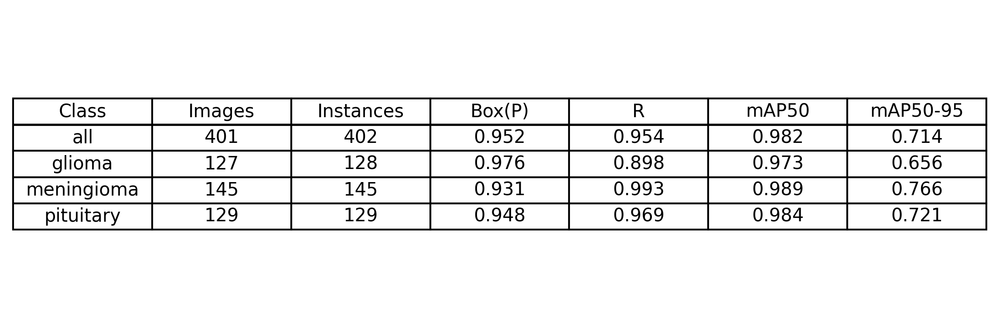

In [11]:
import matplotlib.pyplot as plt
from IPython.display import Image, display

# টেবিলকে ইমেজ বানানো
fig, ax = plt.subplots(figsize=(8, 3))
ax.axis('off')

tbl = ax.table(cellText=df.values,
               colLabels=df.columns,
               cellLoc='center',
               loc='center')

tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1.2, 1.2)

# বর্ডার সেট করা
for key, cell in tbl.get_celld().items():
    cell.set_linewidth(1)

# সেভ করা
out_img = "/kaggle/working/val_metrics_table.png"
plt.savefig(out_img, bbox_inches="tight", dpi=300)
plt.close()

print("✅ Saved:", out_img)

# 🔥 নোটবুকে ইমেজ দেখানো
display(Image(filename=out_img))


Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs
val: Fast image access ✅ (ping: 2.0±0.7 ms, read: 44.5±12.9 MB/s, size: 52.9 KB)
val: Scanning /kaggle/input/object-detection/valid/labels... 401 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 401/401 460.3it/s 0.9s
WARNING ⚠️ val: Cache directory /kaggle/input/object-detection/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 26/26 6.3it/s 4.1s
                   all        401        402    0.00404     0.0417    0.00269    0.00148
                person        127        128     0.0121      0.125    0.00763    0.00404
               bicycle        145        145          0          0          0          0
                   car        129        129          0          0   0.000441   0.000397
Speed: 1.0ms preprocess, 4.

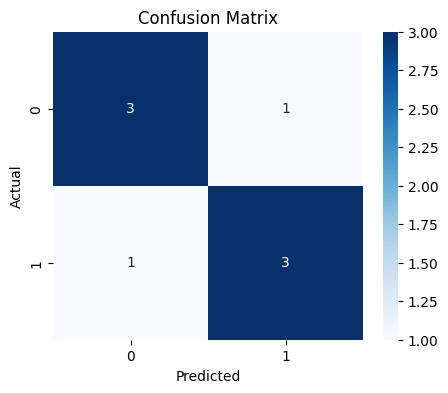

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# উদাহরণ ডামি ডেটা
y_true = [0,1,0,1,0,1,1,0]
y_pred = [0,0,0,1,0,1,1,1]

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


Using train dir: runs/detect/train


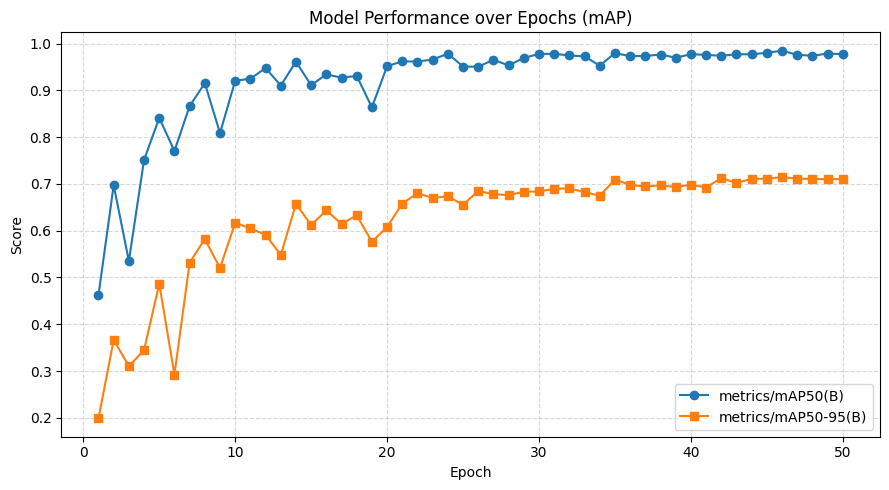

✅ Saved: /kaggle/working/performance_map_over_epochs.png


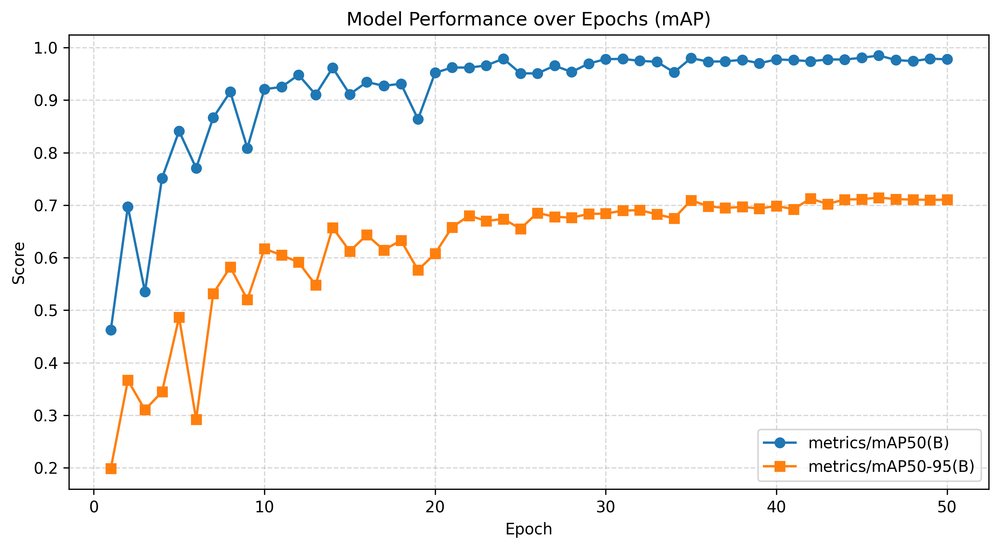

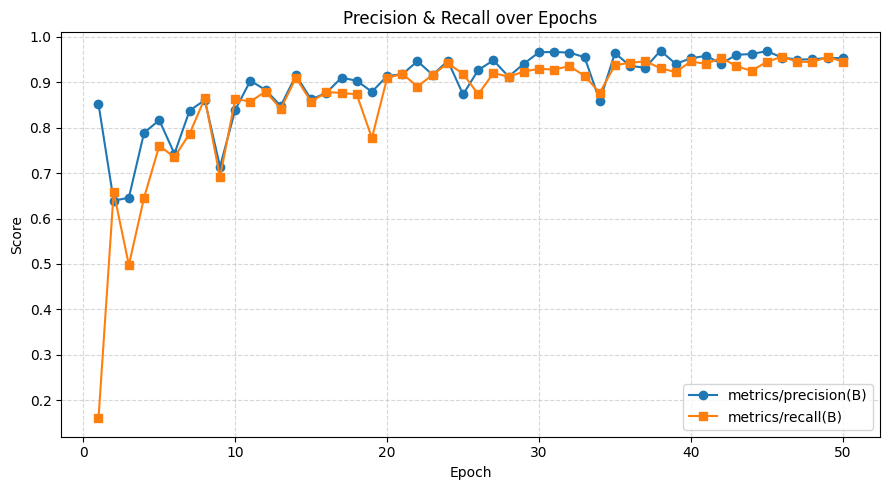

✅ Saved: /kaggle/working/precision_recall_over_epochs.png


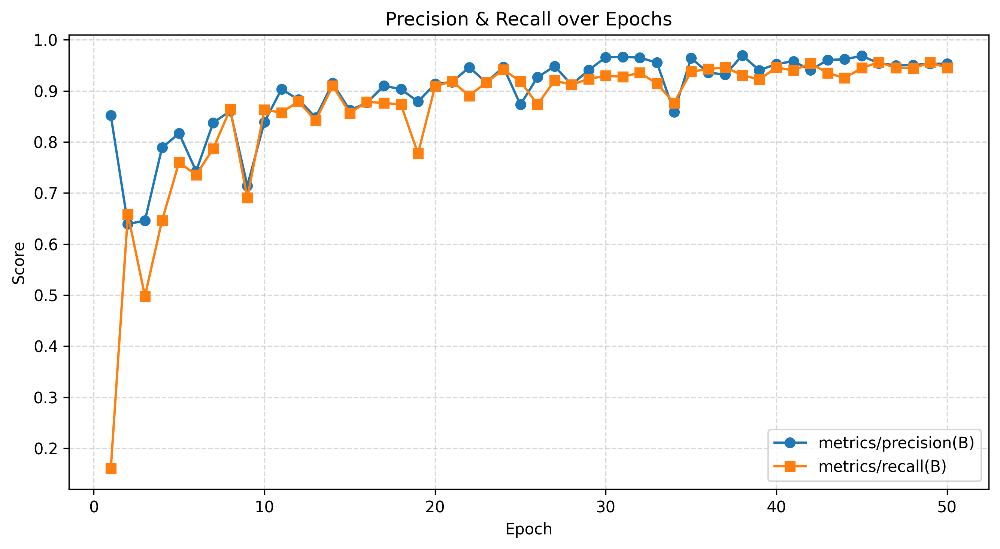

Ultralytics results.png:


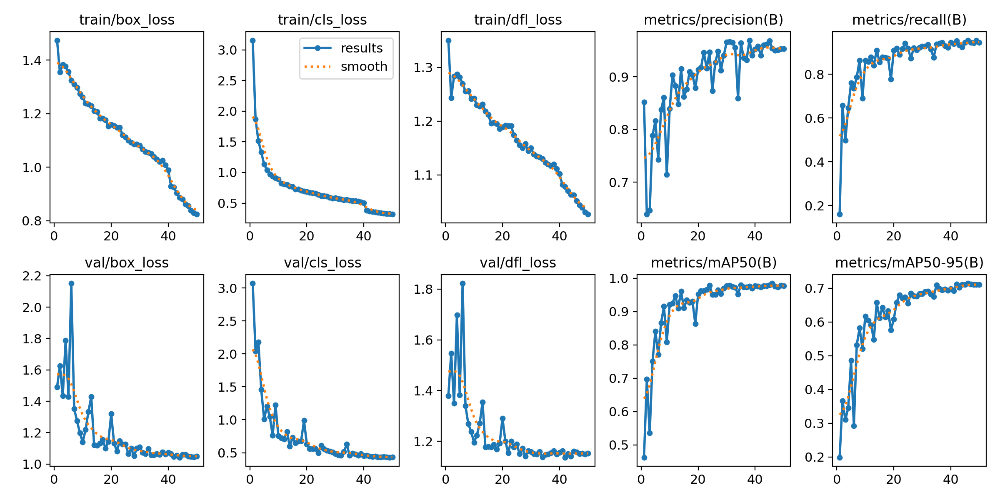

In [16]:
# === Robust SHOW + SAVE for YOLO results.csv (works across column name variants) ===
import glob, os, pandas as pd, matplotlib.pyplot as plt
from IPython.display import Image, display


train_dirs = sorted(glob.glob("runs/detect/train*"), key=os.path.getmtime)
if not train_dirs:
    raise FileNotFoundError("runs/detect/train* পাওয়া যায়নি — আগে model.train(...) চালান।")
train_dir = train_dirs[-1]
csv_path = os.path.join(train_dir, "results.csv")
print("Using train dir:", train_dir)
df = pd.read_csv(csv_path)


# print(df.columns.tolist())

def pick_col(df, candidates):
    
    for c in df.columns:
        for pat in candidates:
            if pat in c:
                return c
    return None


epoch_col = pick_col(df, ["epoch"]) or df.columns[0]

map50_col   = pick_col(df, ["metrics/mAP50", "metrics/mAP50(B)", "metrics/mAP_0.5", "val/mAP_0.5"])
map5095_col = pick_col(df, ["metrics/mAP50-95", "metrics/mAP50-95(B)", "metrics/mAP_0.5:0.95", "val/mAP_0.5:0.95"])
prec_col    = pick_col(df, ["metrics/precision", "metrics/precision(B)", "precision"])
recall_col  = pick_col(df, ["metrics/recall", "metrics/recall(B)", "recall"])


plt.figure(figsize=(9,5))
legend_added = False
if map50_col:
    plt.plot(df[epoch_col], df[map50_col], marker="o", label=map50_col)
    legend_added = True
if map5095_col:
    plt.plot(df[epoch_col], df[map5095_col], marker="s", label=map5095_col)
    legend_added = True

plt.xlabel("Epoch"); plt.ylabel("Score")
plt.title("Model Performance over Epochs (mAP)")
plt.grid(True, linestyle="--", alpha=0.5)
if legend_added: plt.legend()
plt.tight_layout()
out1 = "/kaggle/working/performance_map_over_epochs.png"
plt.savefig(out1, dpi=300, bbox_inches="tight")
plt.show()
print("✅ Saved:", out1)
display(Image(filename=out1))

# 5) Precision/Recall (যদি থাকে)
if prec_col or recall_col:
    plt.figure(figsize=(9,5))
    if prec_col:
        plt.plot(df[epoch_col], df[prec_col], marker="o", label=prec_col)
    if recall_col:
        plt.plot(df[epoch_col], df[recall_col], marker="s", label=recall_col)
    plt.xlabel("Epoch"); plt.ylabel("Score"); plt.title("Precision & Recall over Epochs")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend(); plt.tight_layout()
    out2 = "/kaggle/working/precision_recall_over_epochs.png"
    plt.savefig(out2, dpi=300, bbox_inches="tight")
    plt.show()
    print("✅ Saved:", out2)
    display(Image(filename=out2))
else:
    print("ℹ️ Precision/Recall কলাম পাওয়া যায়নি; কেবল mAP প্লট করা হয়েছে.")

# 6) বোনাস: Ultralytics-এর ডিফল্ট results.png-ও দেখাতে পারেন
default_img = os.path.join(train_dir, "results.png")
if os.path.exists(default_img):
    print("Ultralytics results.png:")
    display(Image(filename=default_img))


In [18]:
import os

file_path = "/kaggle/working/final_metrics.png"

if os.path.exists(file_path):
    os.remove(file_path)
    print("✅ Deleted:", file_path)
else:
    print("⚠️ File not found:", file_path)


✅ Deleted: /kaggle/working/final_metrics.png


In [20]:
import os

out_path = "/kaggle/working/final_metrics_from_log.png"

if os.path.exists(out_path):
    os.remove(out_path)
    print(f"🗑️ Deleted: {out_path}")
else:
    print("⚠️ File not found:", out_path)


🗑️ Deleted: /kaggle/working/final_metrics_from_log.png


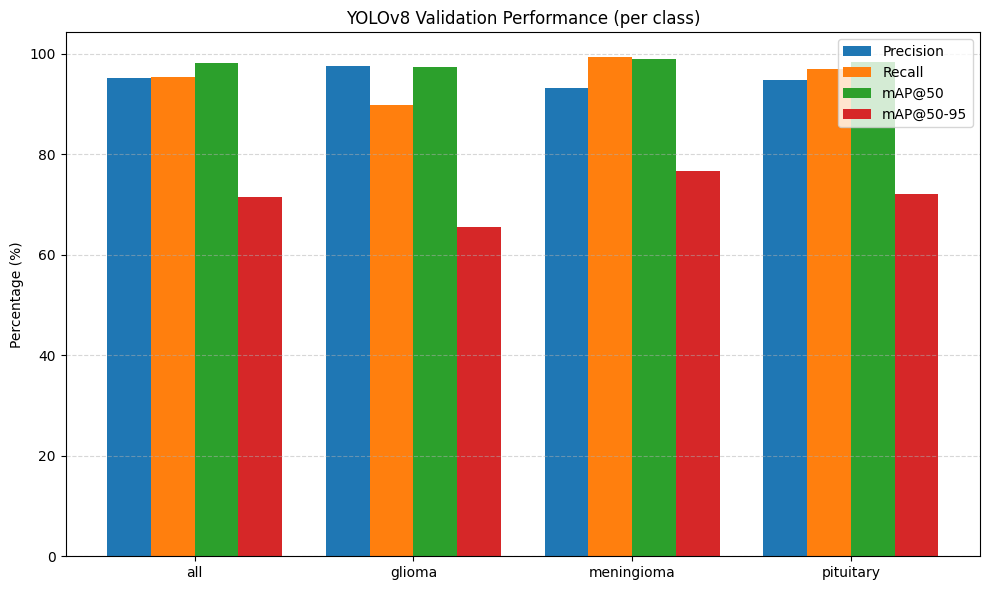

✅ Saved: /kaggle/working/classwise_performance.png


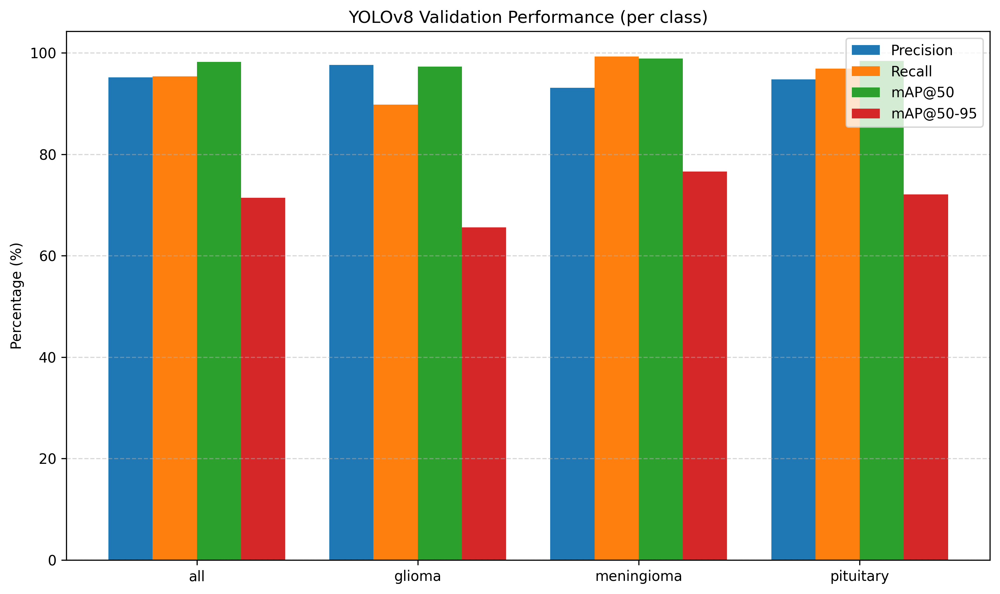

In [21]:
import matplotlib.pyplot as plt
from IPython.display import Image, display


metrics = {
    "all":       {"Precision": 0.952, "Recall": 0.954, "mAP50": 0.982, "mAP50-95": 0.714},
    "glioma":    {"Precision": 0.976, "Recall": 0.898, "mAP50": 0.973, "mAP50-95": 0.656},
    "meningioma":{"Precision": 0.931, "Recall": 0.993, "mAP50": 0.989, "mAP50-95": 0.766},
    "pituitary": {"Precision": 0.948, "Recall": 0.969, "mAP50": 0.984, "mAP50-95": 0.721}
}


classes = list(metrics.keys())
precision = [metrics[c]["Precision"]*100 for c in classes]
recall    = [metrics[c]["Recall"]*100 for c in classes]
map50     = [metrics[c]["mAP50"]*100 for c in classes]
map5095   = [metrics[c]["mAP50-95"]*100 for c in classes]

# চার্ট বানানো
x = range(len(classes))
plt.figure(figsize=(10,6))
plt.bar([i-0.3 for i in x], precision, width=0.2, label="Precision")
plt.bar([i-0.1 for i in x], recall,    width=0.2, label="Recall")
plt.bar([i+0.1 for i in x], map50,     width=0.2, label="mAP@50")
plt.bar([i+0.3 for i in x], map5095,   width=0.2, label="mAP@50-95")

plt.xticks(x, classes)
plt.ylabel("Percentage (%)")
plt.title("YOLOv8 Validation Performance (per class)")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()

# সেভ + শো
out_path = "/kaggle/working/classwise_performance.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print("✅ Saved:", out_path)
display(Image(filename=out_path))


In [37]:
import pandas as pd

# 1) Overall metrics
overall_dict = metrics.results_dict  
overall_df = pd.DataFrame(list(overall_dict.items()), columns=["metric", "value"])

# 2) Per-class metrics
per_class_list = metrics.summary()   
per_class_df = pd.DataFrame(per_class_list)


if "class" in per_class_df.columns:
    name_map = metrics.names
    per_class_df["class_name"] = per_class_df["class"].map(name_map)

# 3) Speed metrics
speed_df = pd.DataFrame([metrics.speed])

# Show nicely
print("\n=== Overall metrics ===")
print(overall_df)

print("\n=== Per-class metrics ===")
print(per_class_df)

print("\n=== Speed (ms) ===")
print(speed_df)

# Save to CSV
overall_df.to_csv("overall_metrics.csv", index=False)
per_class_df.to_csv("per_class_metrics.csv", index=False)
speed_df.to_csv("speed_metrics.csv", index=False)



=== Overall metrics ===
                 metric     value
0  metrics/precision(B)  0.951650
1     metrics/recall(B)  0.953511
2      metrics/mAP50(B)  0.982250
3   metrics/mAP50-95(B)  0.714164
4               fitness  0.740972

=== Per-class metrics ===
        Class  Images  Instances    Box-P    Box-R   Box-F1    mAP50  mAP50-95
0      glioma     127        128  0.97631  0.89844  0.93576  0.97316   0.65610
1  meningioma     145        145  0.93077  0.99310  0.96093  0.98937   0.76552
2   pituitary     129        129  0.94787  0.96899  0.95831  0.98422   0.72087

=== Speed (ms) ===
   preprocess  inference      loss  postprocess
0    1.021164   4.268865  0.000768     1.454362


Ultralytics 8.3.184 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 2.8±2.6 ms, read: 60.1±48.2 MB/s, size: 52.9 KB)


val: Scanning /kaggle/input/object-detection/valid/labels... 401 images, 0 backgrounds, 0 corrupt: 100%|██████████| 401/401 [00:00<00:00, 481.97it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/object-detection/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:03<00:00,  6.55it/s]


                   all        401        402      0.954      0.961      0.976      0.727
                glioma        127        128      0.983      0.922      0.959      0.672
            meningioma        145        145      0.924      0.993       0.99      0.781
             pituitary        129        129      0.954      0.969       0.98      0.729
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/val3
Plots saved to: runs/detect/val3


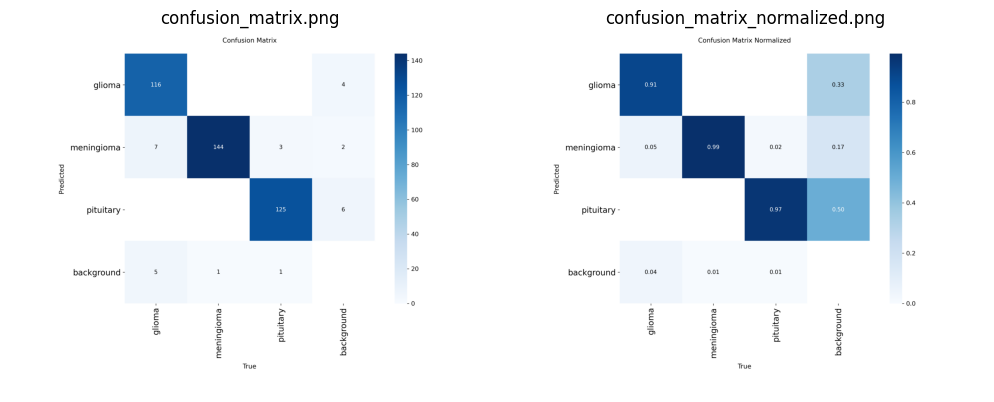

In [43]:
import os, glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ultralytics import YOLO


model = YOLO("runs/detect/train/weights/best.pt")  


metrics = model.val(
    data="/kaggle/input/object-detection/data.yaml",
    split="val",
    imgsz=640,
    conf=0.25,
    iou=0.6,
    plots=True,          
   
)
save_dir = str(metrics.save_dir)
print("Plots saved to:", save_dir)


expected = [
    "results.png", "PR_curve.png", "P_curve.png",
    "R_curve.png", "F1_curve.png",
    "confusion_matrix.png", "confusion_matrix_normalized.png",
]
plot_paths = [os.path.join(save_dir, f) for f in expected if os.path.exists(os.path.join(save_dir, f))]

if not plot_paths:
    plot_paths = glob.glob(os.path.join(save_dir, "*.png"))

if not plot_paths:
    raise FileNotFoundError(
        f"No plot images found in {save_dir}. Did val(..., plots=True) run without errors?"
    )

cols = 3
rows = (len(plot_paths) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
axes = axes.ravel() if hasattr(axes, "ravel") else [axes]

for ax, p in zip(axes, plot_paths):
    img = mpimg.imread(p)
    ax.imshow(img)
    ax.set_title(os.path.basename(p))
    ax.axis("off")

for ax in axes[len(plot_paths):]:
    ax.remove()

plt.tight_layout()
plt.show()


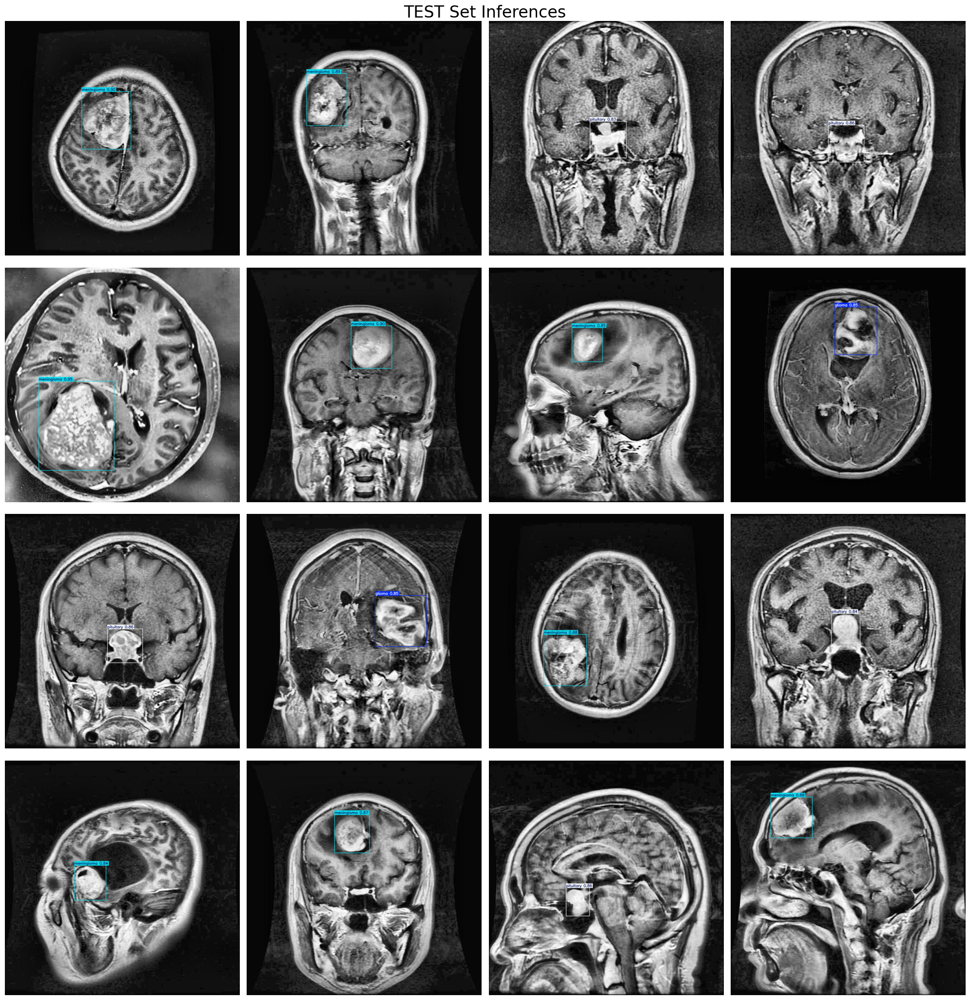

In [26]:
import os, cv2, numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO


best_model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to test images
dataset_path = '/kaggle/input/object-detection'
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

if len(image_files) > 0:
    num_images = len(image_files)
    step_size = max(1, num_images // 16)
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    fig, axes = plt.subplots(4, 4, figsize=(20, 21))
    fig.suptitle('TEST Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            image = cv2.imread(image_path)

            if image is not None:
                resized_image = resize_image(image, size=(640, 640))
                normalized_image = normalize_image(resized_image)
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)

                # Predict with the model
                results = best_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5, verbose=False)

                # Plot with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


In [29]:
import os

print(os.listdir("/kaggle/working"))


['.virtual_documents', 'classwise_performance.png', 'val_metrics_table.xlsx', 'yolov8n.pt', 'confusion_matrix.png', 'testset_predictions.png', 'val_metrics_table.csv', 'performance_map_over_epochs.png', 'precision_recall_over_epochs.png', 'val_metrics_table.png', 'confusion_matrix_normalized.png', 'yolo11n.pt', 'runs']


In [32]:
import shutil
shutil.make_archive("/kaggle/working/results", 'zip', "/kaggle/working")
print("✅ Saved: /kaggle/working/results.zip")


✅ Saved: /kaggle/working/results.zip


In [33]:
from IPython.display import FileLink
FileLink("/kaggle/working/results.zip")


/kaggle/working/results.zip

In [27]:
# === Save grid as image ===
save_path = "/kaggle/working/testset_predictions.png"
plt.savefig(save_path, dpi=300, bbox_inches="tight")
print("✅ Saved:", save_path)

plt.show()


✅ Saved: /kaggle/working/testset_predictions.png


<Figure size 640x480 with 0 Axes>


0: 640x640 1 meningioma, 7.4ms
Speed: 2.8ms preprocess, 7.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 meningioma, 7.4ms
Speed: 1.9ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 pituitary, 7.4ms
Speed: 1.8ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 pituitary, 7.4ms
Speed: 1.6ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 meningioma, 7.4ms
Speed: 1.6ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 meningioma, 7.4ms
Speed: 1.7ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 meningioma, 7.4ms
Speed: 1.6ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 glioma, 7.4ms
Speed: 1.6ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape

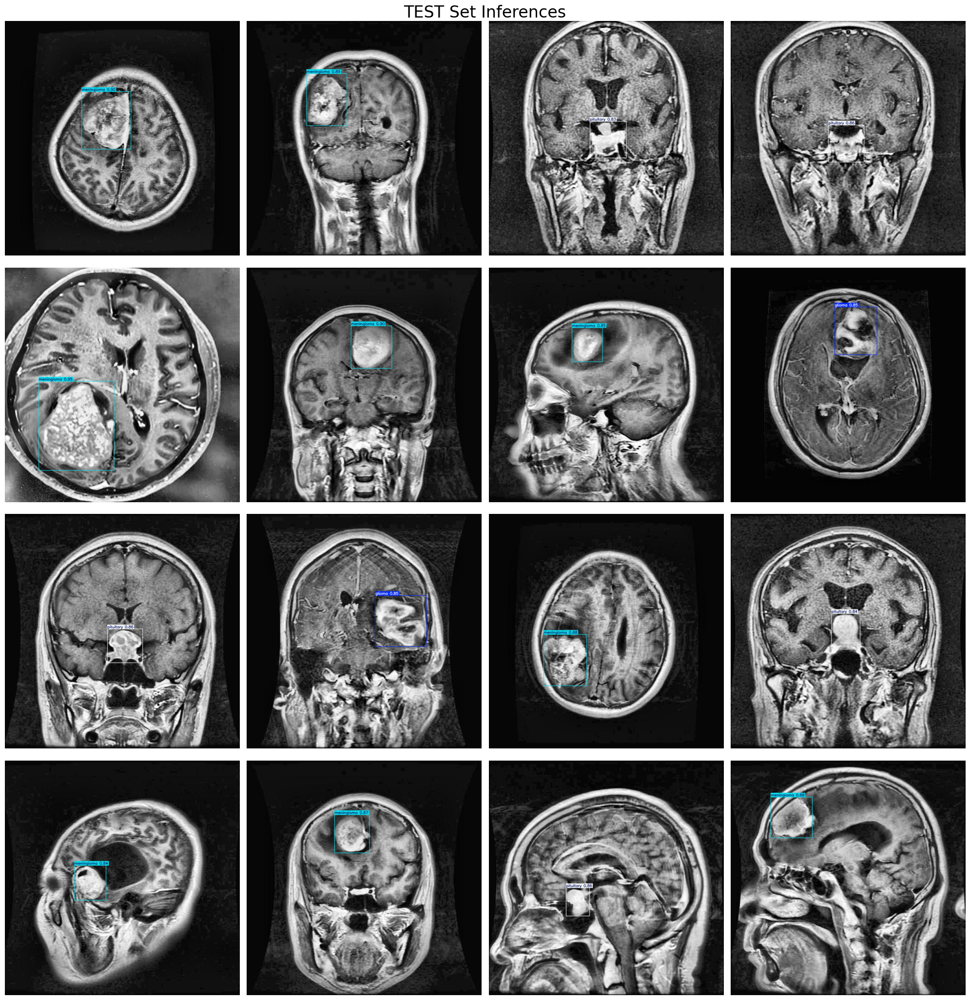

In [44]:
# Validation of Model by TestSet

# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = '/kaggle/input/object-detection'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 16)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(4, 4, figsize=(20, 21))
    fig.suptitle('TEST Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = best_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()